# YOLOv4 model
https://github.com/hunglc007/tensorflow-yolov4-tflite/issues/231#issuecomment-703820916

In [1]:
import os, copy, cv2, dask, glob, re, importlib, datetime, math, random, itertools
import numpy as np
import commonsettings
import tensorflow as tf
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import circle_loss
from IPython import display
batch_size = 32
preferredLoss = circle_loss.CircleLoss(batch_size=batch_size)
input_size = 608
yolov4ModelWorkingPaths = commonsettings.generatePaths(
    targetOssep="/",
    #traindataSrcPathBase = 'F:\\coffeebeans\\darknet\\data',
    traindataSrcPathBase = '/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/darknet/data',
    traindataSrcPathBaseDisplayed = '/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/darknet/data',
    specificProjName = 'purebeans_tiny_filtered_w608h608_20210609')
yolov4TrainedModelWeights = yolov4ModelWorkingPaths['backupBestWeightFileName']['orig']
convertYolov4ToTFCommandList = [
    'save_model.py',
    '--weights',yolov4TrainedModelWeights,
    '--output', os.path.join('models','yolov4-tiny-'+str(input_size)),
    '--input_size',input_size,
    '--model','yolov4','--tiny'
]

workingdir = os.getcwd()
yolo2tfDir = os.path.join(workingdir,'tensorflow-yolov4-tflite')
yoloModelSavedPath = '/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/models/yolov4-tiny-608'
convertYolov4ToTFCommandList[4] = yoloModelSavedPath
convertYolov4ToTFCommandList = list(map(str, convertYolov4ToTFCommandList))
convertYolov4ToTFLiteCommandList = copy.deepcopy(convertYolov4ToTFCommandList)
convertYolov4ToTFLiteCommandList[0] = 'convert_tflite.py'
convertYolov4ToTFLiteCommandList[4] = 'yolov4-tiny-tflite-'+str(input_size)
convertYolov4ToTFLiteCommandList[2] = convertYolov4ToTFCommandList[4]
convertYolov4ToTFLiteCommandList.pop(-2)
convertYolov4ToTFLiteCommandList.pop(-2)
convertYolov4ToTFLiteCommandList.pop(-1)
convertYolov4ToTFLiteCommandList.pop(-1)
convertYolov4ToTFLiteCommandList.pop(-1)
convertYolov4ToTFLiteCommandList.extend(['--quantize_mode','float16'])
convertYolov4ToTFCommand = " ".join(convertYolov4ToTFCommandList)
convertYolov4ToTFLiteCommand = " ".join(convertYolov4ToTFLiteCommandList)
print(yoloModelSavedPath)
print(convertYolov4ToTFCommand)
print(convertYolov4ToTFLiteCommand)
#python save_model.py --weights ./data/yolov4-tiny.weights --output ./checkpoints/yolov4-tiny-416 --input_size 416 --model yolov4 --tiny
#python convert_tflite.py --weights ./checkpoints/yolov4-416 --output ./checkpoints/yolov4-416.tflite


/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/models/yolov4-tiny-608
save_model.py --weights /opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/darknet/data/backup/purebeans_tiny_filtered_w608h608_20210609/yolov4-tiny-obj_best.weights --output /opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/models/yolov4-tiny-608 --input_size 608 --model yolov4 --tiny
convert_tflite.py --weights /opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/models/yolov4-tiny-608 --output yolov4-tiny-tflite-608 --quantize_mode float16


# Convert Model

In [2]:
import cv2
original_image = os.path.join(workingdir,'darknet/data/obj/bad-IMAG0605.jpg')
predictCommandList = copy.deepcopy(convertYolov4ToTFCommandList)
predictCommandList[0] = './detect.py'
predictCommandList[5] = '--size'
predictCommandList.extend(['--image',original_image])
predictCommandList[2] = predictCommandList[4]
for i in [4,3]:
    predictCommandList.pop(i)

predictCommand = " ".join(predictCommandList)
print(predictCommand)

./detect.py --weights /opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/models/yolov4-tiny-608 --size 608 --model yolov4 --tiny --image /opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/darknet/data/obj/bad-IMAG0605.jpg


python tools/model_converter/convert.py F:\coffeebeans\models\purebeans_yolo4tiny_filtered_w448h448_20210615\yolov4-tiny-obj.cfg F:\coffeebeans\models\purebeans_yolo4tiny_filtered_w448h448_20210615\yolov4-tiny-obj_best.weights F:\coffeebeans\models\darknetYolo4Tiny448.h5

# Load Image Data

In [3]:
import random
samples_i = random.sample(range(len(yolov4ModelWorkingPaths['allTakenImages']['orig'])), 64)

image_data_list = list()
origImages = list()
for i in samples_i:
    image_data = cv2.imread(yolov4ModelWorkingPaths['allTakenImages']['orig'][i])
    image_data = cv2.cvtColor(image_data, cv2.COLOR_BGR2RGB)
    origImages.append(image_data)
    image_data = cv2.resize(image_data, (input_size, input_size))
    image_data = image_data/255
    #commonsettings.imShow(image_data, cvtColor=False)
    image_data = image_data.astype(np.float32) #.reshape((1,)+image_data.shape)
    image_data_list.append(image_data)
image_datas = np.asarray(image_data_list) #, axis=0
batch_data = tf.constant(image_datas)

# Load Model

## Try yolo_v4_tiny
https://github.com/RenLuXi/tensorflow-yolov4-tiny

## [keras-YOLOv3-model-set](https://github.com/david8862/keras-YOLOv3-model-set)

In [4]:
#%cd {yolo2tfDir}
from tensorflow.python.saved_model import tag_constants
#5880324 parameters
yoloModelSavedPath = yoloModelSavedPath
yoloModelSavedPath = 'F:\\coffeebeans\\models\\darknetYolo3Tiny640.h5'
yoloModelSavedPath = 'F:\\coffeebeans\\models\\darknetYolo4Tiny608.h5'
yoloModelSavedPath = 'F:\\coffeebeans\\models\\darknetYolo4Tiny448.h5'
yoloModelSavedPath = '/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/models/darknetYolo4Tiny448.h5'
yoloModelSavedPath = '/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/Jerry.Hsieh/coffeebeans/models/darknetYolo4Tiny608.h5'
#yolomodel = tf.keras.models.load_model(yoloModelSavedPath) #yoloModelSavedPath

#7300682 parameters
#clsModel = "F:/coffeebeans/models/ownbeansclassify-badcondense-DenseNet121-normalized-circleloss-norefreshtflearnweights-w299h325-lrschedule-leakyrelu-.epoch057-val_loss5.83303-val_f1_score0.90-val_AUC0.97-val_recall0.91-val_precision0.91-val_binary_accuracy0.94.hdf5"
clsModel = "/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/tj/ownbeansclassify-badcondense-DenseNet121-normalized-circleloss-norefreshtflearnweights-w299h325-lrschedule-leakyrelu-.epoch057-val_loss5.83303-val_f1_score0.90-val_AUC0.97-val_recall0.91-val_precision0.91-val_binary_accuracy0.94.hdf5"
#clsModel = "/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/tj/ownbeansclassify-badcondense-DenseNet121-normalized-circleloss-norefreshtflearnweights-sampleweights-lrschedule-leakyrelu-.epoch079-val_loss6.92724-val_f1_score0.90-val_AUC0.96-val_recall0.89-val_precision0.91-val_binary_accuracy0.93.hdf5"
clsModel = "/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/tj/ownbeansclassify-badcondense-DenseNet121-normalized-circleloss-norefreshtflearnweights-sampleweights-lrschedule-leakyrelu-.epoch062-val_loss5.80467-val_f1_score0.89-val_AUC0.97-val_recall0.89-val_precision0.91-val_binary_accuracy0.94.hdf5"
#clsModel = tf.keras.models.load_model(clsModel, custom_objects={'CircleLoss':preferredLoss})

In [5]:
if False:
    import importlib.util
    import os, sys
    workingdir = os.getcwd()
    MODULE_NAME = "kerasYolo3"
    MODULE_FOLDER = os.path.join(workingdir, MODULE_NAME)
    sys.path.append(MODULE_FOLDER)
    MODULE_PATH = os.path.join(MODULE_FOLDER, '__init__.py')

    spec = importlib.util.spec_from_file_location(MODULE_NAME, MODULE_PATH)
    module = importlib.util.module_from_spec(spec)
    sys.modules[spec.name] = module 
    spec.loader.exec_module(module)

In [6]:
yoloModel = tf.keras.models.load_model(yoloModelSavedPath)
#preferredLoss = circle_loss.CircleLoss(batch_size=circle_loss_batch_size)
clsModel = tf.keras.models.load_model(clsModel, custom_objects={'CircleLoss':preferredLoss})
#yoloModel.summary()

In [7]:
def rename(model, layer, new_name):
    def _get_node_suffix(name):
        for old_name in old_nodes:
            if old_name.startswith(name):
                return old_name[len(name):]

    old_name = layer.name
    old_nodes = list(model._network_nodes)
    new_nodes = []

    for l in model.layers:
        if l.name == old_name:
            l._name = new_name
            # vars(l).__setitem__('_name', new)  # bypasses .__setattr__
            new_nodes.append(new_name + _get_node_suffix(old_name))
        else:
            new_nodes.append(l.name + _get_node_suffix(l.name))
    model._network_nodes = set(new_nodes)

for layerkey, layer in enumerate(yoloModel.layers):
    newname = "{}_layer{}_{}".format('Yolo',layerkey,layer.name)
    rename(yoloModel, yoloModel.layers[layerkey], newname)
yoloModel._name = "yoloModel"
for layerkey, layer in enumerate(clsModel.layers):
    newname = "{}_layer{}_{}".format('Cls',layerkey,layer.name)
    rename(clsModel, clsModel.layers[layerkey], newname)
clsModel._name = "clsModel"

In [8]:
#from kerasYolo3.eval import yolo_predict_keras
#from yolo3.postprocess_np import yolo3_postprocess_np, yolo3_decode
#from common.yolo_postprocess_np import yolo_decode, yolo_correct_boxes, yolo_handle_predictions, yolo_adjust_boxes
num_classes = 1
anchors = np.array([10.,14.,23.,27.,37.,58.,81.,82.,135.,169.,344.,319.]).reshape(-1, 2)
anchor_mask = [[3,4,5], [0,1,2]] #anchors[anchor_mask[0]]
yoloModelInputSize = 608 #448
model_image_size = (yoloModelInputSize,yoloModelInputSize)
image_shape = origImages[0].shape[0:2]
input_dims = model_image_size
elim_grid_sense = False
scale_x_y = [1.05, 1.05] if elim_grid_sense else [None, None]
clsModelInputShape = clsModel.layers[0].input_shape[0][1:]
#resizeForClsLayer = tf.keras.layers.experimental.preprocessing.Resizing(clsModelInputShape[0], clsModelInputShape[1])
#pred_boxes, pred_classes, pred_scores = yolo3_postprocess_np(res, image_shape, anchors, 1, model_image_size, max_boxes=100, confidence=conf_threshold, elim_grid_sense=elim_grid_sense)

In [9]:
import tensorflow.experimental.numpy as tnp
tnp.experimental_enable_numpy_behavior()

def tf_yolo_decode(prediction, anchors, num_classes, input_dims, scale_x_y=None, use_softmax=False):
    '''Decode final layer features to bounding box parameters.'''
    batch_size = tf.shape(prediction)[0]
    num_anchors = len(anchors)

    grid_size = tf.shape(prediction)[1:3]
    #check if stride on height & width are same
    #assert input_dims[0]//grid_size[0] == input_dims[1]//grid_size[1], 'model stride mismatch.'
    tf.debugging.assert_equal(input_dims[0]//grid_size[0], input_dims[1]//grid_size[1], 'model stride mismatch.')
    stride = input_dims[0] // grid_size[0]

    prediction = tf.reshape(prediction,
                            (batch_size, grid_size[0] * grid_size[1] * num_anchors, num_classes + 5))

    ################################
    # generate x_y_offset grid map
    grid_y = tf.range(grid_size[0])
    grid_x = tf.range(grid_size[1])
    x_offset, y_offset = tf.meshgrid(grid_x, grid_y)

    x_offset = tf.reshape(x_offset, (-1, 1))
    y_offset = tf.reshape(y_offset, (-1, 1))

    x_y_offset = tf.concat((x_offset, y_offset), axis=1)
    x_y_offset = tf.tile(x_y_offset, (1, num_anchors))
    x_y_offset = tf.reshape(x_y_offset, (-1, 2))
    x_y_offset = tf.expand_dims(x_y_offset, 0)

    ################################

    # Log space transform of the height and width
    anchors = tf.tile(anchors, (grid_size[0] * grid_size[1], 1))
    anchors = tf.expand_dims(anchors, 0)

    if scale_x_y:
        # Eliminate grid sensitivity trick involved in YOLOv4
        #
        # Reference Paper & code:
        #     "YOLOv4: Optimal Speed and Accuracy of Object Detection"
        #     https://arxiv.org/abs/2004.10934
        #     https://github.com/opencv/opencv/issues/17148
        #
        box_xy_tmp = tf.math.sigmoid(prediction[..., :2]) * scale_x_y - (scale_x_y - 1) / 2 #expit
        box_xy = (box_xy_tmp + x_y_offset) / tnp.array(grid_size)[::-1]
    else:
        box_xy = (tf.math.sigmoid(prediction[..., :2]) + x_y_offset) / tnp.array(grid_size)[::-1] #expit
    box_wh = (tf.exp(prediction[..., 2:4]) * anchors) / tnp.array(input_dims)[::-1]

    # Sigmoid objectness scores
    objectness = tf.math.sigmoid(prediction[..., 4])  # p_o (objectness score) #expit
    objectness = tf.expand_dims(objectness, -1)  # To make the same number of values for axis 0 and 1

    if use_softmax:
        # Softmax class scores
        class_scores = tf.nn.softmax(prediction[..., 5:], axis=-1) #softmax
    else:
        # Sigmoid class scores
        class_scores = tf.math.sigmoid(prediction[..., 5:]) #expit
    box_xy = tf.cast(box_xy, tf.float32)#
    #box_yx = tf.stack( [box_xy[:,:,1],box_xy[:,:,0]], axis=2 )
    box_wh = tf.cast(box_wh, tf.float32)
    #box_shiftwh = tf.math.multiply(box_wh, tf.constant([0.5]))
    #box_hw = tf.stack( [box_wh[:,:,1],box_wh[:,:,0]], axis=2 )
    box_x1y1 = tf.math.add(box_xy,-box_wh)
    box_x2y2 = tf.math.add(box_xy,box_wh)
    return tf.concat([
        tf.reverse(box_x1y1, axis=tf.constant([2])), #becomes y,x
        tf.reverse(box_x2y2, axis=tf.constant([2])), # becomes y2,x2
        objectness,
        class_scores
        ], axis=2)

#testi = 0
#func_num_classes = tf.cast(num_classes, tf.int32)
#funcanchor = tf.cast(anchors[anchor_mask[testi]], tf.float32)
#tf_yolo_decode(predictions[testi], funcanchor, func_num_classes, input_dims, scale_x_y=None, use_softmax=False)

In [22]:
def processDecodeYolo(predictionsInput):
    decoded_yolo_predicts = list()
    for testi, prediction in enumerate(predictionsInput):
        decoded_yolo_predict = tf_yolo_decode(prediction, anchors[anchor_mask[testi]], num_classes, input_dims)
        decoded_yolo_predicts.append(decoded_yolo_predict)
    decoded_yolo_predicts = tf.concat(decoded_yolo_predicts, axis=1)
    return decoded_yolo_predicts

def handleYoloPredResOutputBoxesFirst(yoloPredRes,max_output_size_per_class=50,
        max_total_size=50,
        iou_threshold=0.45,
        score_threshold=0.25):
    """
    boxes	A 4-D float Tensor of shape [batch_size, num_boxes, q, 4]. If q is 1 then same boxes are used for all classes otherwise, if q is equal to number of classes, class-specific boxes are used.
    scores	A 3-D float Tensor of shape [batch_size, num_boxes, num_classes] representing a single score corresponding to each box (each row of boxes).
    max_output_size_per_class	A scalar integer Tensor representing the maximum number of boxes to be selected by non-max suppression per class
    max_total_size	A int32 scalar representing maximum number of boxes retained over all classes. Note that setting this value to a large number may result in OOM error depending on the system workload.
    iou_threshold	A float representing the threshold for deciding whether boxes overlap too much with respect to IOU.
    score_threshold	A float representing the threshold for deciding when to remove boxes based on score.
    pad_per_class	If false, the output nmsed boxes, scores and classes are padded/clipped to max_total_size. If true, the output nmsed boxes, scores and classes are padded to be of length max_size_per_class*num_classes, unless it exceeds max_total_size in which case it is clipped to max_total_size. Defaults to false.
    clip_boxes	If true, the coordinates of output nmsed boxes will be clipped to [0, 1]. If false, output the box coordinates as it is. Defaults to true.
    """
    pred_boxes = yoloPredRes[:, :, 0:4] #tf.stack([
    #    yoloPredRes[:, :, 1],
    #    yoloPredRes[:, :, 0],
    #    tf.math.add(yoloPredRes[:, :, 1],yoloPredRes[:, :, 3]),
    #    tf.math.add(yoloPredRes[:, :, 0],yoloPredRes[:, :, 2])
    #], axis=2)#
    pred_boxconf = yoloPredRes[:, :, 4:5]
    pred_class_probs = yoloPredRes[:, :, 5:]
    pred_boxandclass_scores = pred_boxconf * pred_class_probs
    pred_classes = tf.math.argmax(pred_boxandclass_scores, axis=-1)
    pred_class_scores = tf.math.reduce_max(pred_boxandclass_scores, axis=-1)
    #print("pred_boxandclass_scores shape is {} pred_class_scores shape is {}".format(pred_boxandclass_scores.shape,pred_class_scores.shape))
    boxes, scores, classes, valid_detections = tf.image.combined_non_max_suppression(
        boxes=tf.reshape(pred_boxes, (tf.shape(pred_boxes)[0], -1, 1, 4)), #<tf.Tensor: shape=(5, 5415, 1, 4), dtype=float64
        scores=pred_boxconf,#tf.reshape(pred_boxconf, (tf.shape(pred_boxconf)[0], -1, tf.shape(pred_boxconf)[-1])), #<tf.Tensor: shape=(5, 5415, 1), dtype=float64
        max_output_size_per_class=max_output_size_per_class,
        max_total_size=max_total_size,
        iou_threshold=iou_threshold,
        score_threshold=score_threshold
    )
    return boxes, scores, classes, valid_detections

def removeEmptyBoxes(yoloPredRes):
    boxes, scores, classes, valid_detections = yoloPredRes
    #boxesInfForCrop = tf.map_fn(fn=lambda t: tf.slice(t[0],0,t[1]), elems=[boxes, valid_detections] )
    box_indices = tf.map_fn(lambda x: tf.repeat(x[0], tf.size(x[1])), elems=[tf.range(0, tf.size(valid_detections)), scores], dtype=tf.int32)
    box_indices = tf.reshape(box_indices, [-1])
    newboxes = tf.reshape(boxes, [-1, boxes.shape[2] ] )
    newscores = tf.reshape(scores, [-1] )
    newclasses = tf.reshape(classes, [-1] )
    #newboxes = tf.math.not_equal(newboxes, tf.constant([0.,0.,0.,0.]), name=None)
    mask = tf.math.reduce_sum(newboxes, axis=1, keepdims=False)
    mask = tf.cast(mask, dtype=tf.bool)
    nonzero_box_indices = tf.boolean_mask(box_indices, mask)
    nonzero_box_indices = tf.cast(nonzero_box_indices, dtype=tf.int32)
    nonzero_boxes = tf.boolean_mask(newboxes, mask)
    nonzero_boxes = tf.cast(nonzero_boxes, dtype=tf.float32)
    nonzero_boxes_byBatches = tf.RaggedTensor.from_row_lengths(nonzero_boxes, valid_detections)
    nonzero_scores = tf.boolean_mask(newscores, mask)
    nonzero_scores = tf.RaggedTensor.from_row_lengths(nonzero_scores, valid_detections)
    nonzero_classes = tf.boolean_mask(newclasses, mask)
    nonzero_classes = tf.RaggedTensor.from_row_lengths(nonzero_classes, valid_detections)
    return {'nonzero_boxes':nonzero_boxes,
            'nonzero_scores':nonzero_scores,
            'nonzero_classes':nonzero_classes,
            'nonzero_box_indices':nonzero_box_indices,
            'nonzero_boxes_byBatches':nonzero_boxes_byBatches,
            'valid_detections':valid_detections}

model = ''
inputlayer = tf.keras.Input(shape=(None,None,3), name='Input')
resizeForYoloImputLayer = tf.keras.layers.experimental.preprocessing.Resizing(yoloModelInputSize, yoloModelInputSize, name="resizeForYoloImputs")(inputlayer)
yoloinfer = yoloModel(resizeForYoloImputLayer)
yolodecodelayer = tf.keras.layers.Lambda(
    lambda x: processDecodeYolo(x),
    name = "YoloDecode"
)(yoloinfer)
handleYoloOutputlayer = tf.keras.layers.Lambda(
    lambda x: handleYoloPredResOutputBoxesFirst(x,max_output_size_per_class=300,
        max_total_size=300,
        iou_threshold=0.4,
        score_threshold=0.2),
    name = "ExtractBoxesScoresClassesValidDetections"
)(yolodecodelayer)
handleYoloOutputlayer = tf.keras.layers.Lambda(lambda x: removeEmptyBoxes(x), name='ExtractNonZeroBoxes')(handleYoloOutputlayer)
def cropboxes_and_resize_with_pad(inputs): #preventing image aspect ratios from distorting
    images = inputs[0]
    handleYoloOutputlayerOutputs = inputs[1]
    #imageWidths = tf.ragged.map_flat_values(lambda x: x.shape, rt)
    #imagebatches = tf.size(handleYoloOutputlayerOutputs['valid_detections'])
    images_shapes_in_batches = tf.map_fn(tf.shape, images)
    #for batchi in tf.range(imagebatches):
    #    imagesInABatch = images[batchi,:,:,:]
    """
    'nonzero_boxes':nonzero_boxes,
    'nonzero_scores':nonzero_scores,
    'nonzero_classes':nonzero_classes,
    'nonzero_box_indices':nonzero_box_indices,
    'nonzero_boxes_byBatches':nonzero_boxes_byBatches,
    'valid_detections':valid_detections
    """
    #unstackedImages = tf.unstack(images, num=None, axis=0, name='unstack')
    return images_shapes
cropbboxFromImage = tf.keras.layers.Lambda(
    cropboxes_and_resize_with_pad, name="CropObjectsFromImages"
)([inputlayer, handleYoloOutputlayer['nonzero_boxes'], handleYoloOutputlayer['nonzero_box_indices']])

if False:

    cropbboxFromImage = tf.keras.layers.Lambda(
        lambda lambdaInput: tf.image.crop_and_resize( 
            lambdaInput[0], #image
            lambdaInput[1], #boxes
            lambdaInput[2], #box_indices
            tf.constant([clsModelInputShape[0],clsModelInputShape[1]]), #crop_size
            method='bilinear', extrapolation_value=0
        ), name="CropObjectsFromImages"
    )([inputlayer, handleYoloOutputlayer['nonzero_boxes'], handleYoloOutputlayer['nonzero_box_indices']])
    predBeansClassification = clsModel(cropbboxFromImage)
    predBeansClassificationByBatches = tf.keras.layers.Lambda(
        lambda lambdaInput: tf.RaggedTensor.from_row_lengths(lambdaInput[0], lambdaInput[1]), name="SplitPredClassResByBatches"
    )([predBeansClassification,handleYoloOutputlayer['valid_detections']])
    sumAllOutputs = tf.keras.layers.Lambda(
        lambda lambdaInput: {
            'boxes': lambdaInput[0],
            'classes': lambdaInput[1],
            'scores': lambdaInput[2],
            'valid_detections': lambdaInput[3],
        }, name="ConnectBoxesClassPredsScores"
    )([handleYoloOutputlayer['nonzero_boxes_byBatches'], predBeansClassificationByBatches, handleYoloOutputlayer['nonzero_scores'], handleYoloOutputlayer['valid_detections']])


    cropbboxFromImage = tf.keras.layers.Lambda( cropboxes_and_resize_with_pad, name='CropboxesAndResizeWithPad')([inputlayer, handleYoloOutputlayer])


outputs = cropbboxFromImage
model = tf.keras.Model(inputs=inputlayer, outputs=outputs)
model.summary()
print(model.output_shape)

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input (InputLayer)              [(None, None, None,  0                                            
__________________________________________________________________________________________________
resizeForYoloImputs (Resizing)  (None, 608, 608, 3)  0           Input[0][0]                      
__________________________________________________________________________________________________
yoloModel (Functional)          [(None, None, None,  5880324     resizeForYoloImputs[0][0]        
__________________________________________________________________________________________________
YoloDecode (Lambda)             (None, None, 6)      0           yoloModel[1][0]                  
                                                                 yoloModel[1][1]            

## Show Predictions

In [24]:
%%time
#clsModel.summary()
#yoloModel.summary()
predstartingPoint = 25
predTargetBatchesIndices = range(predstartingPoint, predstartingPoint+5)
predictions = model.predict(batch_data[predTargetBatchesIndices,:,:])
#print(predictions.keys())
#print(predictions['valid_detections'])

CPU times: user 238 ms, sys: 325 ms, total: 563 ms
Wall time: 631 ms


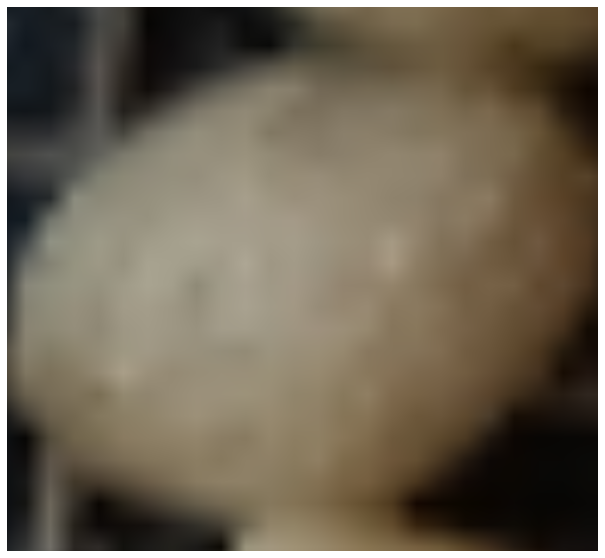

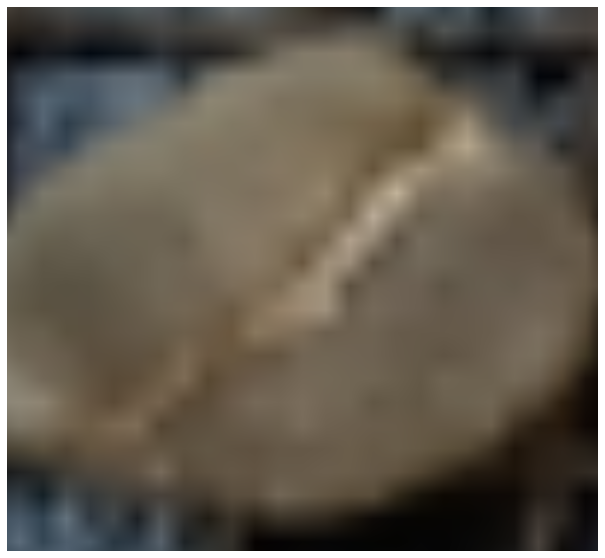

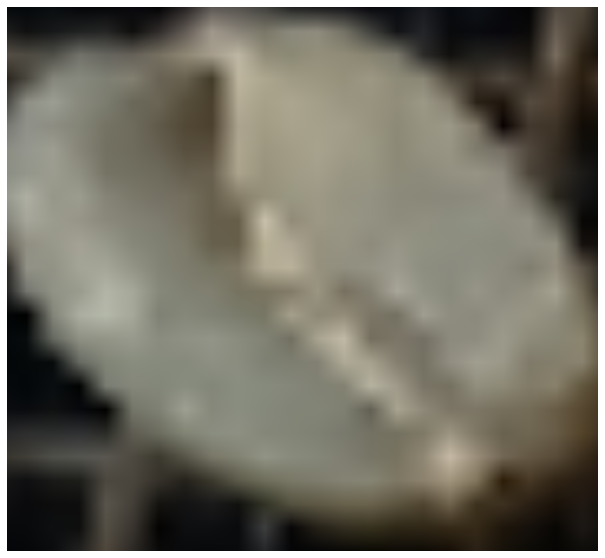

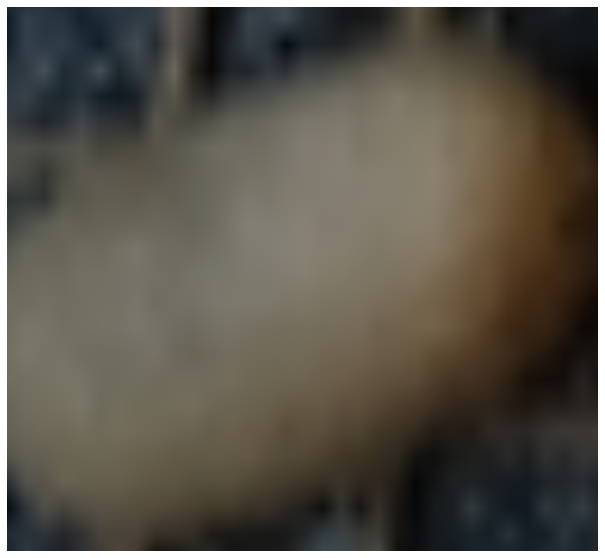

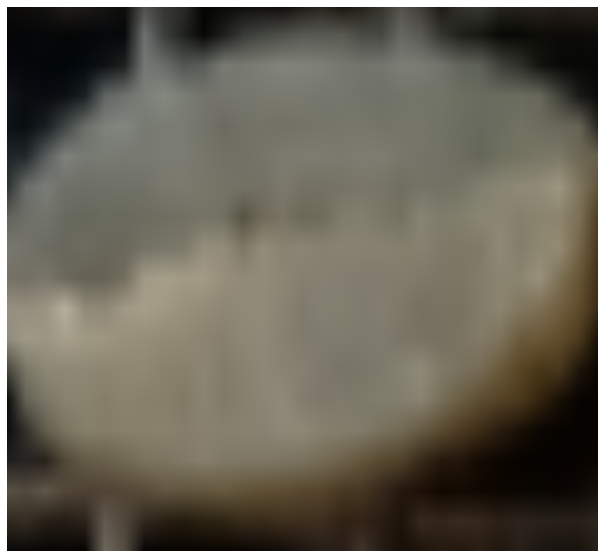

...

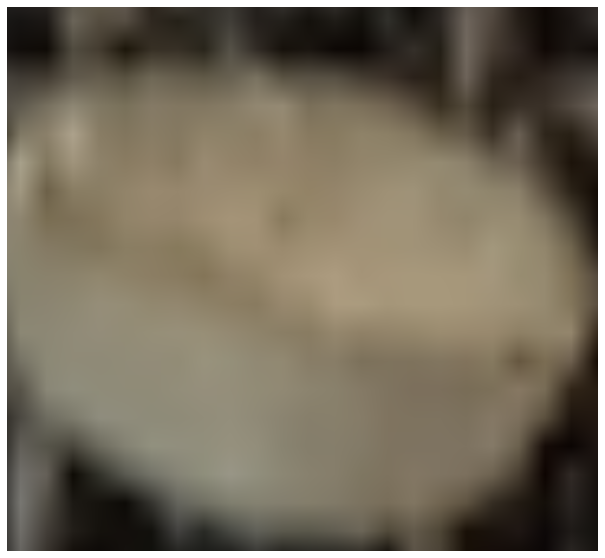

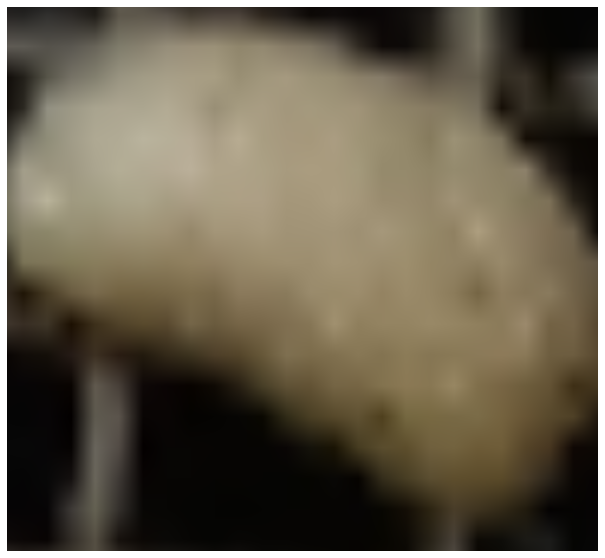

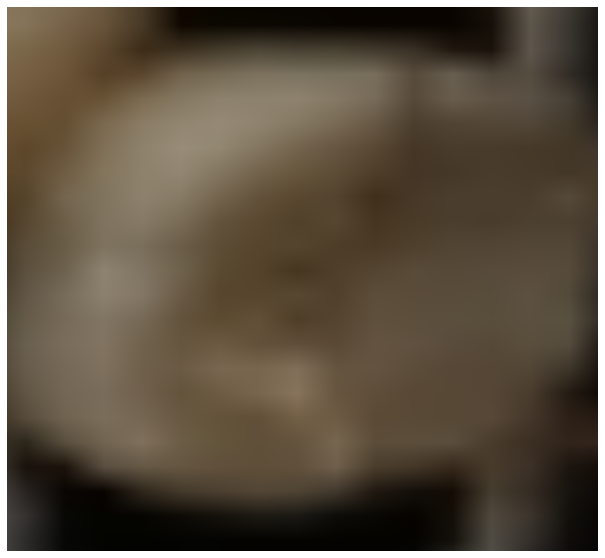

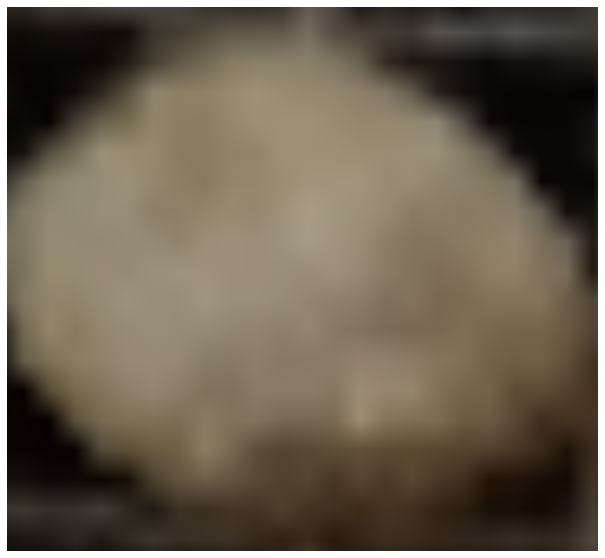

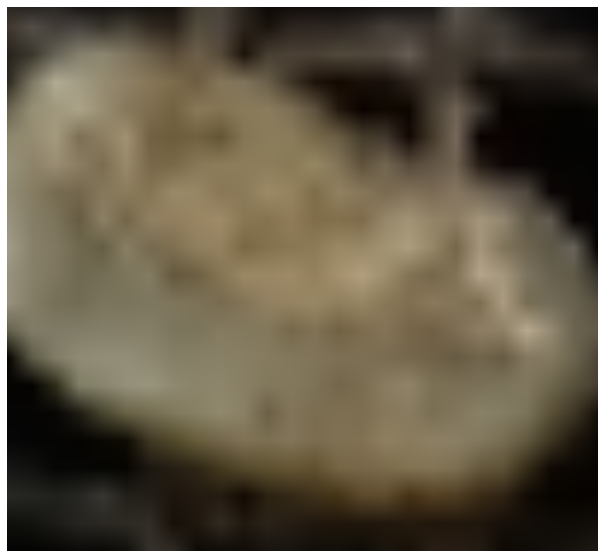

In [28]:
for i,image in enumerate(predictions):
    commonsettings.imShow(image)
    if i>40: 
        break

[4.0053481805389386e-15, 2.1421242557551068e-09, 1.0]
[4.225506866606908e-15, 2.2002133448495442e-09, 1.0]
[3.965727790914645e-15, 2.1037636077636535e-09, 1.0]
[4.165808831517372e-15, 2.181796743272457e-09, 1.0]
[4.342211489596079e-15, 2.231381746042871e-09, 1.0]
[3.982737483044932e-15, 2.1269790373423803e-09, 1.0]
[4.038672150749817e-15, 2.1451378451331493e-09, 1.0]
[4.3002105138735276e-15, 2.232693141479558e-09, 1.0]
[4.243372062013922e-15, 2.2079571504463047e-09, 1.0]
[4.066700470974462e-15, 2.141842703196062e-09, 1.0]
[3.900255108707203e-15, 2.1116390858111345e-09, 1.0]
[4.075474885275069e-15, 2.16112949757985e-09, 1.0]
[3.980428894747191e-15, 2.114617370096994e-09, 1.0]
[4.236643655797408e-15, 2.1934130067791102e-09, 1.0]
[3.94066408600539e-15, 2.1239103809023163e-09, 1.0]
[4.2217206293326814e-15, 2.195065906818172e-09, 1.0]
[4.151467293170936e-15, 2.175787550129371e-09, 1.0]
[4.058455875782362e-15, 2.147102717842131e-09, 1.0]
[3.91062448604749e-15, 2.100199347765397e-09, 1.0]
[4.

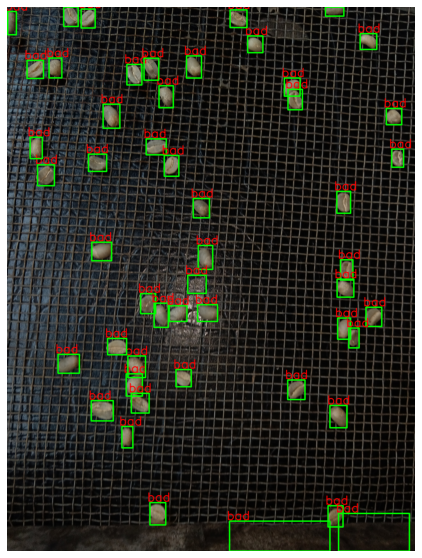

[1.923114403116241e-15, 1.3101388862679642e-09, 1.0]
[2.021713061583141e-15, 1.3774862361870532e-09, 1.0]
[2.1909100103795556e-15, 1.4310428397834585e-09, 1.0]
[1.3207529577860945e-15, 1.0346374867964414e-09, 1.0]
[1.2887706877636666e-15, 1.0285889917582836e-09, 1.0]
[2.35032394039342e-15, 1.5522391150213366e-09, 1.0]
[1.9045487114618476e-15, 1.3254054520572822e-09, 1.0]
[1.9636868577732483e-15, 1.3268320886439255e-09, 1.0]
[1.7398562838789313e-15, 1.2193612786148833e-09, 1.0]
[9.423597292041938e-16, 8.139043328192486e-10, 1.0]
[2.731389028528316e-15, 1.6662370372344526e-09, 1.0]
[1.4108663578247561e-15, 1.0566045816062797e-09, 1.0]
[2.7113431467985956e-15, 1.6667394131530955e-09, 1.0]
[1.7559117933941366e-15, 1.2652486836017829e-09, 1.0]
[2.656640276757255e-15, 1.6173675732034098e-09, 1.0]
[1.2937555825373766e-15, 1.0154002083595515e-09, 1.0]
[1.6271588678841019e-15, 1.1184794201923864e-09, 1.0]
[2.698187878094789e-15, 1.6206872510693415e-09, 1.0]
[3.0709012213697576e-15, 1.8023297299

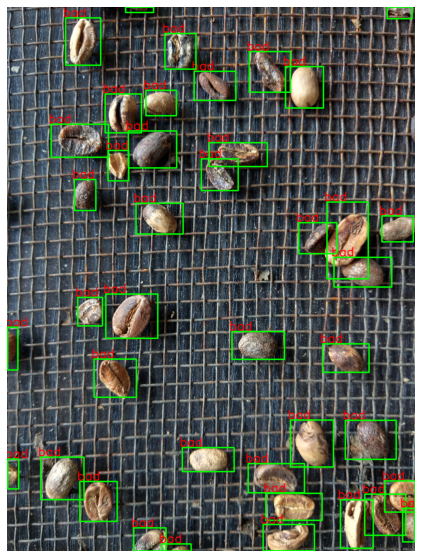

[3.811519513636369e-15, 2.083577310685314e-09, 1.0]
[3.659843864870383e-15, 2.023694545272292e-09, 1.0]
[3.726209743320705e-15, 2.0469554939950285e-09, 1.0]
[3.639794595008874e-15, 2.0090262786709445e-09, 1.0]
[4.2331055991767265e-15, 2.2168018531942835e-09, 1.0]
[3.686185318980571e-15, 2.0413954970877057e-09, 1.0]
[3.1149327468251147e-15, 1.8355512665380047e-09, 1.0]
[4.3017360202115325e-15, 2.2294037727021987e-09, 1.0]
[3.5133194469731243e-15, 1.9455816957503203e-09, 1.0]
[4.134494023457381e-15, 2.1905364189223064e-09, 1.0]
[4.138644061382453e-15, 2.186470782206129e-09, 1.0]
[3.8578903323338055e-15, 2.075719374161622e-09, 1.0]
[3.7566813300817046e-15, 2.0577832771095927e-09, 1.0]
[3.640336272578643e-15, 2.0386563548413505e-09, 1.0]
[4.238065824115848e-15, 2.204573856801062e-09, 1.0]
[4.3460561721436666e-15, 2.24868124121258e-09, 1.0]
[3.826087209779722e-15, 2.0789010513055928e-09, 1.0]
[4.110056699412621e-15, 2.171952173668501e-09, 1.0]
[4.04855998985959e-15, 2.1365178515253547e-09, 

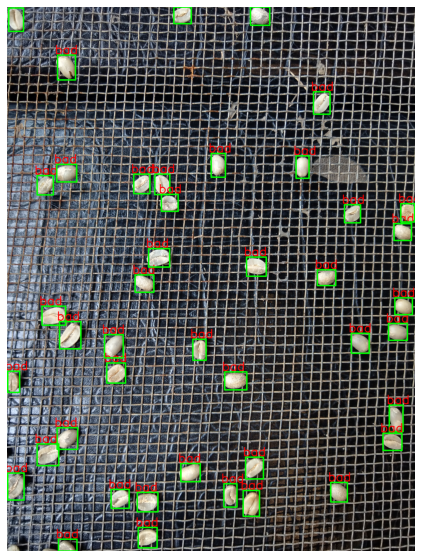

[4.1825118977207535e-15, 2.206353322264931e-09, 1.0]
[4.014924311524122e-15, 2.139372234921666e-09, 1.0]
[3.556361002671378e-15, 1.988686548770602e-09, 1.0]
[3.861556714445996e-15, 2.0944508349884927e-09, 1.0]
[4.162885720816398e-15, 2.2010866462807144e-09, 1.0]
[3.882501298132753e-15, 2.1021189233749737e-09, 1.0]
[3.623102116717333e-15, 2.0074863993357894e-09, 1.0]
[3.944950919751444e-15, 2.125215115000856e-09, 1.0]
[3.6035157503614985e-15, 2.009463040408832e-09, 1.0]
[3.792389698039104e-15, 2.0692050295423314e-09, 1.0]
[4.188451292746901e-15, 2.2047799141944324e-09, 1.0]
[3.579785275311222e-15, 1.9975785470194296e-09, 1.0]
[3.981431358240266e-15, 2.1408459449645534e-09, 1.0]
[4.164140176611281e-15, 2.203913940235225e-09, 1.0]
[3.759447739687437e-15, 2.081491867755858e-09, 1.0]
[3.876581808380866e-15, 2.0963533131634904e-09, 1.0]
[3.928432083214091e-15, 2.1100003966267877e-09, 1.0]
[4.258663971327178e-15, 2.19852291927225e-09, 1.0]
[4.319774857372734e-15, 2.229926687746797e-09, 1.0]
[

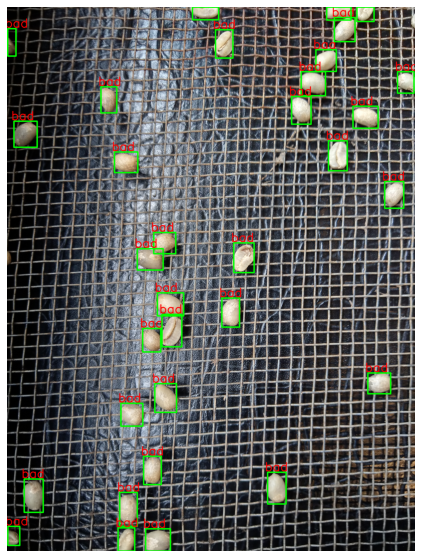

[2.0280234570401855e-15, 1.3608123516917203e-09, 1.0]
[3.979396785100961e-15, 2.100275509064886e-09, 1.0]
[4.171040106999615e-15, 2.18956319741892e-09, 1.0]
[2.0053371618556368e-15, 1.3445377033960426e-09, 1.0]
[4.1657292104203304e-15, 2.2262889309843104e-09, 1.0]
[4.521632126065853e-15, 2.289021194812335e-09, 1.0]
[2.6666208659747526e-15, 1.6208416830920669e-09, 1.0]
[4.214351442691569e-15, 2.1694597229782175e-09, 1.0]
[3.979244742686929e-15, 2.130454479498667e-09, 1.0]
[3.281426601728604e-15, 1.8792092326691545e-09, 1.0]
[4.007197253462795e-15, 2.1200532440701636e-09, 1.0]
[3.561397460575752e-15, 1.967310758743679e-09, 1.0]
[2.7006283917740655e-15, 1.663268300866605e-09, 1.0]
[2.016852363015322e-15, 1.3545610189069635e-09, 1.0]
[1.7029660932018752e-15, 1.2154556250365545e-09, 1.0]
[1.6701488604516914e-15, 1.1990174408893495e-09, 1.0]
[3.2527367487721537e-15, 1.8714578775558266e-09, 1.0]
[2.644244584848899e-15, 1.6265804259063543e-09, 1.0]


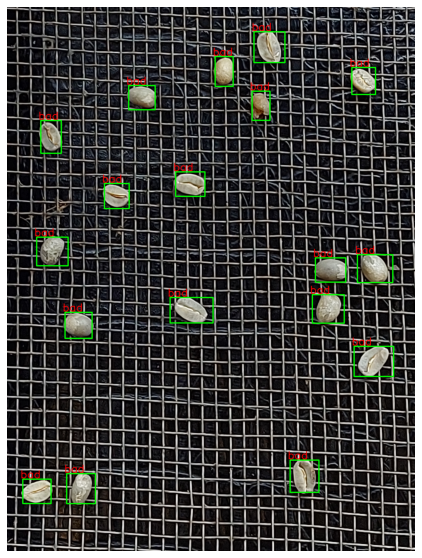

In [21]:
import cv2
yoloModelInputSize = 608 #yoloModelInputSize 448
labelclasses = ['good','unlabel','bad']

for idi,batchi in enumerate(predTargetBatchesIndices):
    #commonsettings.imShow(batch_data[batchi].numpy())
    boxes_in_percentage = predictions['boxes'][idi,:,:]
    boxscores = predictions['scores'][idi,:].numpy()
    #boxclassscores = predictions['classes'][idi,:,:].numpy()
    img = copy.deepcopy(origImages[batchi])#batch_data[batchi,:,:].numpy()
    imgheight = img.shape[0]
    imgwidth = img.shape[1]
    matrix_for_box = tnp.array([
        [imgheight,0,0,0],
        [0,imgwidth,0,0],
        [0,0,imgheight,0],
        [0,0,0,imgwidth]
    ], dtype='float32')
    boxes = tf.matmul(boxes_in_percentage, matrix_for_box).astype('int16').numpy()
    #boxes = tf.multiply(boxes_in_percentage, yoloModelInputSize).astype('int16').numpy()
    for boxi,box in enumerate(boxes):
        predClasses = predictions['classes'][idi,boxi,:].numpy().tolist()
        print(predClasses)
        predClasses = [labelclasses[i] for i,classpredv in enumerate(predClasses) if classpredv>0.95]
        predClasses = " ".join(predClasses) if len(predClasses)>0 else ""
        cv2.rectangle(img,(box[1],box[0]),(box[3],box[2]),(0,255,0), 10 )
        #str(round(boxscores[boxi],2))+
        cv2.putText(img, predClasses, (box[1]-20, box[0]-10), cv2.FONT_HERSHEY_SIMPLEX, 3, (255,0,0), 5, cv2.LINE_AA)
    commonsettings.imShow(img)
#boxes

## With [hunglc007/tensorflow-yolov4-tflite](https://github.com/hunglc007/tensorflow-yolov4-tflite)

In [ ]:
yoloModel = tf.saved_model.load(yoloModelSavedPath, tags=[tag_constants.SERVING])
#yolomodel = tf.keras.models.load_model(yoloModelSavedPath)
clsModel = tf.keras.models.load_model(clsModel, custom_objects={'CircleLoss':preferredLoss})

In [ ]:
def handleYoloPredResOutputBoxesFirst(yoloPredRes,max_output_size_per_class=50,
        max_total_size=50,
        iou_threshold=0.45,
        score_threshold=0.25):
    pred_boxes = yoloPredRes[:, :, 0:4]
    pred_conf = yoloPredRes[:, :, 4:]
    boxes, scores, classes, valid_detections = tf.image.combined_non_max_suppression(
        boxes=tf.reshape(pred_boxes, (tf.shape(pred_boxes)[0], -1, 1, 4)),
        scores=tf.reshape(pred_conf, (tf.shape(pred_conf)[0], -1, tf.shape(pred_conf)[-1])),
        max_output_size_per_class=max_output_size_per_class,
        max_total_size=max_total_size,
        iou_threshold=iou_threshold,
        score_threshold=score_threshold
    )
    return boxes, scores, classes, valid_detections

def removeEmptyBoxes(yoloPredRes):
    boxes, scores, classes, valid_detections = yoloPredRes
    #boxesInfForCrop = tf.map_fn(fn=lambda t: tf.slice(t[0],0,t[1]), elems=[boxes, valid_detections] )
    box_indices = tf.map_fn(lambda x: tf.repeat(x[0], tf.size(x[1])), elems=[tf.range(0, tf.size(valid_detections)), scores], dtype=tf.int32)
    box_indices = tf.reshape(box_indices, [-1])
    newboxes = tf.reshape(boxes, [-1, boxes.shape[2] ] )
    newscores = tf.reshape(scores, [-1] )
    newclasses = tf.reshape(classes, [-1] )
    #newboxes = tf.math.not_equal(newboxes, tf.constant([0.,0.,0.,0.]), name=None)
    mask = tf.math.reduce_sum(newboxes, axis=1, keepdims=False)
    mask = tf.cast(mask, dtype=tf.bool)
    nonzero_box_indices = tf.boolean_mask(box_indices, mask)
    nonzero_box_indices = tf.cast(nonzero_box_indices, dtype=tf.int32)
    nonzero_boxes = tf.boolean_mask(newboxes, mask)
    nonzero_boxes = tf.cast(nonzero_boxes, dtype=tf.float32)
    nonzero_boxes_byBatches = tf.RaggedTensor.from_row_lengths(nonzero_boxes, valid_detections)
    nonzero_scores = tf.boolean_mask(newscores, mask)
    nonzero_scores = tf.RaggedTensor.from_row_lengths(nonzero_scores, valid_detections)
    nonzero_classes = tf.boolean_mask(newclasses, mask)
    nonzero_classes = tf.RaggedTensor.from_row_lengths(nonzero_classes, valid_detections)
    return {'nonzero_boxes':nonzero_boxes,
            'nonzero_scores':nonzero_scores,
            'nonzero_classes':nonzero_classes,
            'nonzero_box_indices':nonzero_box_indices,
            'nonzero_boxes_byBatches':nonzero_boxes_byBatches,
            'valid_detections':valid_detections}


circle_loss_batch_size=32
max_output_size_per_class=70
max_total_size=70
iou_threshold=0.45
score_threshold=0.25
yoloModelInputSize = 608

inputlayer = tf.keras.Input(shape=(None,None,3), name='Input')
#yolomodel = tf.saved_model.load(yoloModelSavedPath, tags=[tag_constants.SERVING])
yoloinfer = yoloModel.signatures['serving_default']
circle_loss_batch_size = circle_loss_batch_size
preferredLoss = circle_loss.CircleLoss(batch_size=circle_loss_batch_size)
#clsModel = tf.keras.models.load_model(clsModel, custom_objects={'CircleLoss':preferredLoss})
clsModelInputShape = clsModel.layers[0].input_shape[0][1:]
resizeForClsLayer = tf.keras.layers.experimental.preprocessing.Resizing(clsModelInputShape[0], clsModelInputShape[1])

yololayer = tf.keras.layers.experimental.preprocessing.Resizing(yoloModelInputSize, yoloModelInputSize)(inputlayer)
yoloinferlayer = tf.keras.layers.Lambda(
    lambda x: list(  (yoloinfer(x)).values())[0], name='YoloInfer'
)(yololayer)
handleYoloOutputlayer = tf.keras.layers.Lambda(
    lambda x: handleYoloPredResOutputBoxesFirst(x), name='ExtractBoxesScoresClassesValidDetections'
)(yoloinferlayer)
handleYoloOutputlayer = tf.keras.layers.Lambda(
    lambda x: removeEmptyBoxes(x), name='ExtractNonZeroBoxes'
)(handleYoloOutputlayer)
cropbboxFromImage = tf.keras.layers.Lambda(
    lambda lambdaInput: tf.image.crop_and_resize( 
        lambdaInput[0], #image
        lambdaInput[1], #boxes
        lambdaInput[2], #box_indices
        tf.constant([clsModelInputShape[0],clsModelInputShape[1]]), #crop_size
        method='bilinear', extrapolation_value=0
    ), name="CropObjectsFromImages"
)([inputlayer, handleYoloOutputlayer['nonzero_boxes'], handleYoloOutputlayer['nonzero_box_indices']])
predBeansClassification = clsModel(cropbboxFromImage)
predBeansClassificationByBatches = tf.keras.layers.Lambda(
    lambda lambdaInput: tf.RaggedTensor.from_row_lengths(lambdaInput[0], lambdaInput[1]), name="SplitPredClassResByBatches"
)([predBeansClassification,handleYoloOutputlayer['valid_detections']])
sumAllOutputs = tf.keras.layers.Lambda(
    lambda lambdaInput: {
        'boxes': lambdaInput[0],
        'classes': lambdaInput[1],
        'scores': lambdaInput[2],
        'valid_detections': lambdaInput[3],
    }, name="ConnectBoxesClassPredsScores"
)([handleYoloOutputlayer['nonzero_boxes_byBatches'], predBeansClassificationByBatches, handleYoloOutputlayer['nonzero_scores'], handleYoloOutputlayer['valid_detections']]) #nonzero_boxes_byBatches, classes, nonzero_scores, valid_detections

outputs = sumAllOutputs
model = tf.keras.Model(inputs=inputlayer, outputs=outputs)


#model = MyModel()

boxes (5, 50, 4) tf.float32
scores (5, 50) tf.float32
classes (5, 50) tf.float32
box.indices (178,) dtype('int32')
valid_detections (5,) dtype('int32')

# Export Model

* [Notice some errors](https://stackoverflow.com/questions/63373692/how-to-rename-the-layers-of-a-keras-model-without-corrupting-the-structure)

In [ ]:
%%time

model.summary()
res = model.predict(batch_data)

In [11]:
saved_two_stage_model_dir = os.path.join(workingdir,'models','twoStagedDetection')
model.save(saved_two_stage_model_dir)
save_to_h5_format_path = os.path.join(saved_two_stage_model_dir, 'model.h5')
model.save(save_to_h5_format_path)

INFO:tensorflow:Assets written to: f:\coffeebeans\models\twoStagedDetection\assets
INFO:tensorflow:Assets written to: f:\coffeebeans\models\twoStagedDetection\assets


In [12]:
saved_two_stage_model_dir = os.path.join(workingdir,'models','twoStagedDetection')
targetTFLiteFile = os.path.join(saved_two_stage_model_dir,'model.tflite')
print(targetTFLiteFile)
converter = tf.lite.TFLiteConverter.from_keras_model(model) # path to the SavedModel directory
converter.experimental_new_converter = True
converter.target_spec.supported_ops =[tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]
tflite_model = converter.convert()
with open(targetTFLiteFile, 'wb') as f:
    f.write(tflite_model)

f:\coffeebeans\models\twoStagedDetection\model.tflite
INFO:tensorflow:Assets written to: R:\Temp\Q-DirPortableTemp\tmpuqh_yxo6\assets
INFO:tensorflow:Assets written to: R:\Temp\Q-DirPortableTemp\tmpuqh_yxo6\assets


In [ ]:
tf.keras.utils.plot_model( model, to_file="model.png", show_shapes=True, show_dtype=True, expand_nested=True )

## Directly Load Model

In [ ]:
import os
import tensorflow as tf
import tensorflow_addons as tfa
import circle_loss
from IPython import display
workingdir = os.getcwd()
batch_size = 32
num_classes = 3
custom_objects={
    'CircleLoss':circle_loss.CircleLoss(batch_size=batch_size),
    'binary_accuracy':tf.keras.metrics.BinaryAccuracy(),
    'recall':tf.keras.metrics.Recall(thresholds=0.5),
    'precision':tf.keras.metrics.Precision(thresholds=0.5),
    'f1_score':tfa.metrics.F1Score(num_classes=num_classes, average='micro', threshold=0.5),
    'AUC':tf.keras.metrics.AUC(multi_label=True, num_labels=num_classes)
}
saved_two_stage_model_dir = os.path.join(workingdir,'models','twoStagedDetection')
save_to_h5_format_path = os.path.join(saved_two_stage_model_dir, 'model.h5')
two_stage_model = tf.keras.models.load_model(saved_two_stage_model_dir, custom_objects=custom_objects)

## Load TFLite Model

In [1]:
import os, copy, cv2, dask, glob, re, importlib, datetime, math, random, itertools
import numpy as np
import commonsettings
import tensorflow as tf
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import circle_loss
from IPython import display
#import tflite_runtime.interpreter as tflite
workingdir = os.getcwd()
saved_two_stage_model_dir = os.path.join(workingdir,'models','twoStagedDetection')
targetTFLiteFile = os.path.join(saved_two_stage_model_dir,'model.tflite')
interpreter = tf.lite.Interpreter(model_path=targetTFLiteFile)
interpreter